In [ ]:
import numpy as np
import pandas as pd
import networkx as nx

import pybedtools as bt

from collections import Counter, deque
import pickle
import re
import os

from mycolorpy import colorlist as mcp
import matplotlib.patches as mpatches
import matplotlib.collections as mcol
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
import seaborn as sns

from matplotlib import gridspec
from scipy.stats import shapiro, mannwhitneyu, iqr

from scipy.spatial import distance
from scipy.cluster import hierarchy


from sklearn.preprocessing import minmax_scale

from adjustText import adjust_text

color1=mcp.gen_color(cmap="Reds",n=10)[-7:-2]
color2=mcp.gen_color(cmap="Greys",n=10)[-7:-2]
color3=mcp.gen_color(cmap="Blues",n=10)[-7:-2]
color4=mcp.gen_color(cmap="Greens",n=10)[-7:-2]



def flatten(l):
    return [item for sublist in l for item in sublist]

def change_width(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_width()
        diff = current_width - new_value

        # we change the bar width
        patch.set_width(new_value)

        # we recenter the bar
        patch.set_x(patch.get_x() + diff * .5)

        
def change_height(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_height()
        diff = current_width - new_value

        # we change the bar width
        patch.set_height(new_value)

        # we recenter the bar
        patch.set_y(patch.get_y() + diff * .5)



colorPalette = {
    "ANDR"    : color1[-1],
    "High"    : color2[-1],
    "Mid-high": color2[-1],
    "Mid-low" : color2[-1],
    "low"     : color2[-1],
    
    "ARcre"   : "#F19323",
    "cre"     : "#888888",
}

MAPty = pickle.load(open('../data/pickle/MAPty.p', 'rb'))
MAPcl = pickle.load(open('../data/pickle/MAPcl.p', 'rb'))
MAPgn = pickle.load(open('../data/pickle/MAPgn.p', 'rb'))


BEDPRO = pickle.load(open('../data/pickle/BEDPRO.p', 'rb'))
GENES = dict(zip(BEDPRO['Gene'], BEDPRO['Name']))

# N contains BW signal for RNA seq but BEDPRO contains  
N = pd.read_table('../data/TABLE/Epigenome.tmm.tsv').set_index('Name').drop_duplicates()
N.loc[N.index.isin(BEDPRO['Name']), 'RNAseq_Vh'] = N[N.index.isin(BEDPRO['Name'])].index.map(dict(zip(BEDPRO['Name'], BEDPRO['Vh'])))
N.loc[N.index.isin(BEDPRO['Name']), 'RNAseq_30m'] = N[N.index.isin(BEDPRO['Name'])].index.map(dict(zip(BEDPRO['Name'], BEDPRO['30m'])))
N.loc[N.index.isin(BEDPRO['Name']), 'RNAseq_4h'] = N[N.index.isin(BEDPRO['Name'])].index.map(dict(zip(BEDPRO['Name'], BEDPRO['4h'])))
N.loc[N.index.isin(BEDPRO['Name']), 'RNAseq_16h'] = N[N.index.isin(BEDPRO['Name'])].index.map(dict(zip(BEDPRO['Name'], BEDPRO['16h'])))
N.loc[N.index.isin(BEDPRO['Name']), 'RNAseq_72h'] = N[N.index.isin(BEDPRO['Name'])].index.map(dict(zip(BEDPRO['Name'], BEDPRO['72h'])))

T = pd.read_table('../data/TABLE/TF.tmm.tsv').set_index('Name').drop_duplicates()




H = pickle.load(open('../data/G/G_ALL.p', 'rb'))



BEDPES_H3K27ac = {}
for i, h in  enumerate(["Vh", "30m","4h", "16h", "72h"]):
    BEDPES_H3K27ac[h] = bt.BedTool(f"../data/BEDPE/ALL_H3K27ac_{h}.tmm.bedpe")

BEDPES_H3K4me3 = {}
for i, h in  enumerate(["Vh", "30m","4h", "16h", "72h"]):
    BEDPES_H3K4me3[h] = bt.BedTool(f"../data/BEDPE/ALL_H3K4me3_{h}.tmm.bedpe")
    
    
    

In [2]:
!readlink -f ../data/G/G_ALL.p

/groups/lackgrp/ll_members/berkay/1-notebook/col-matt-LNCaP/data/G/G_ALL.p


KMT2A
KMT2B
KMT2C
KMT2D
KMT2E


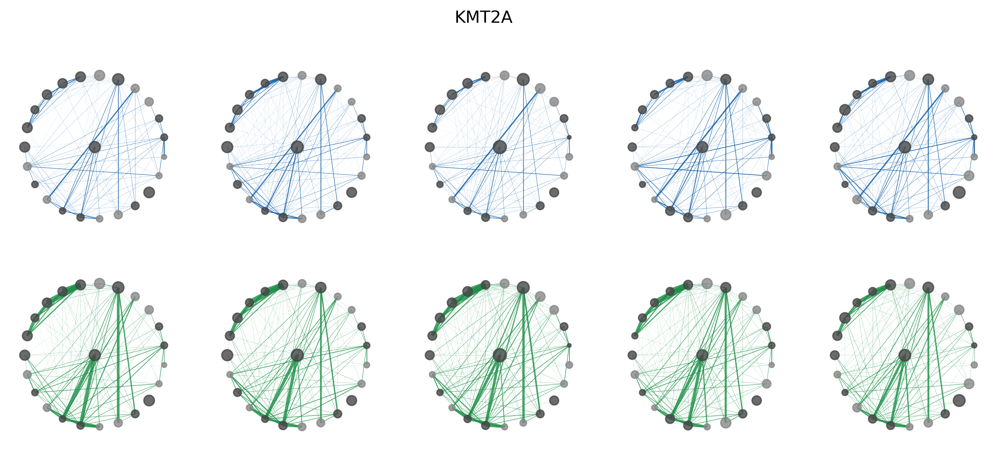

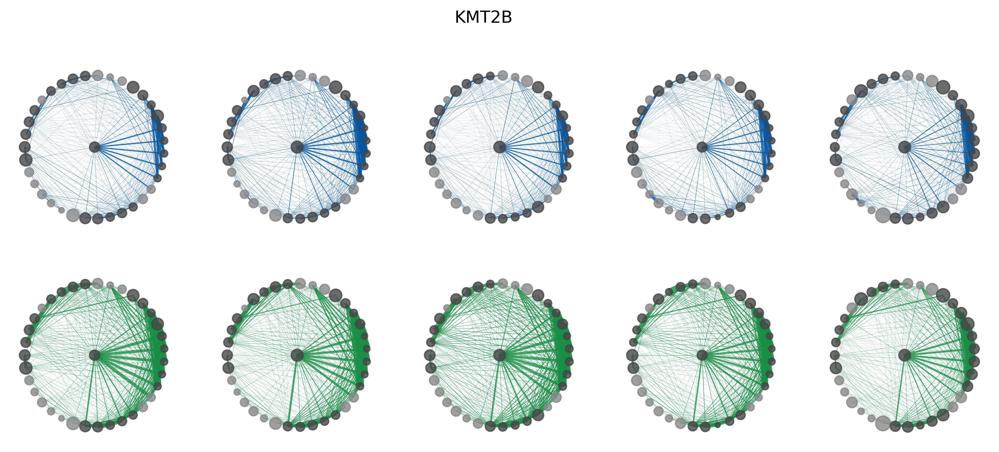

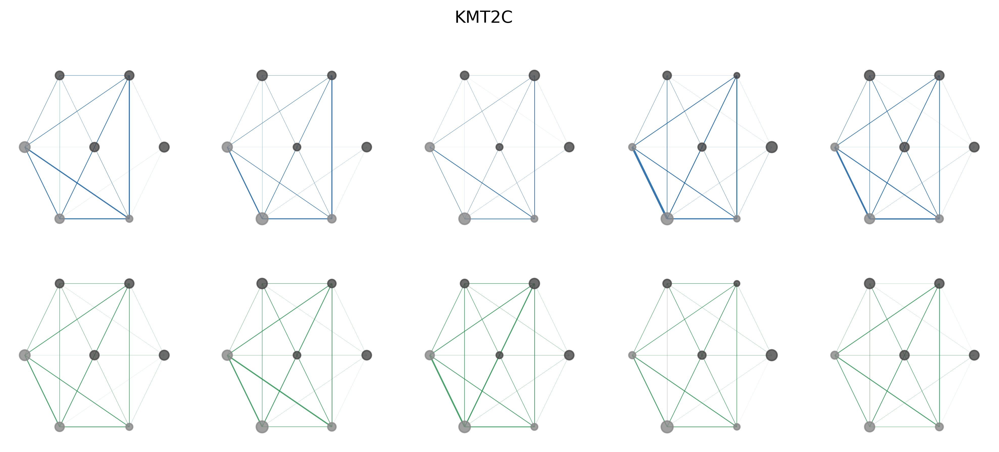

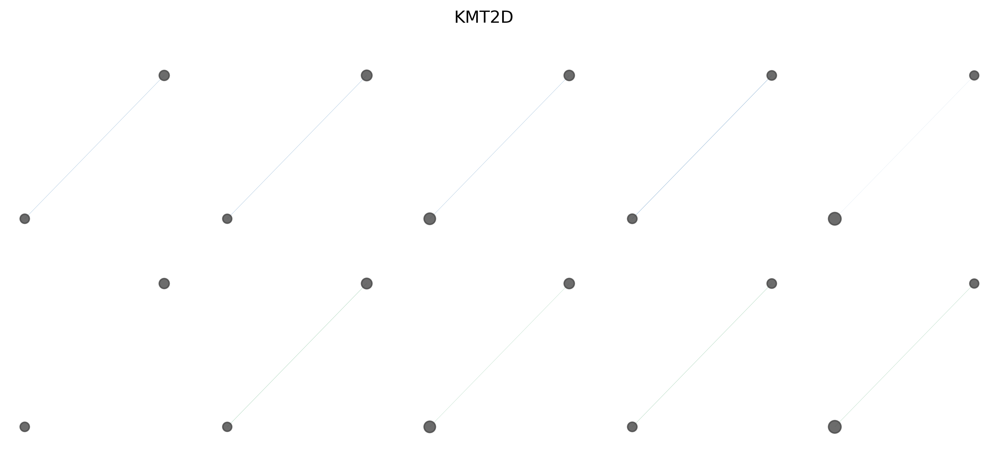

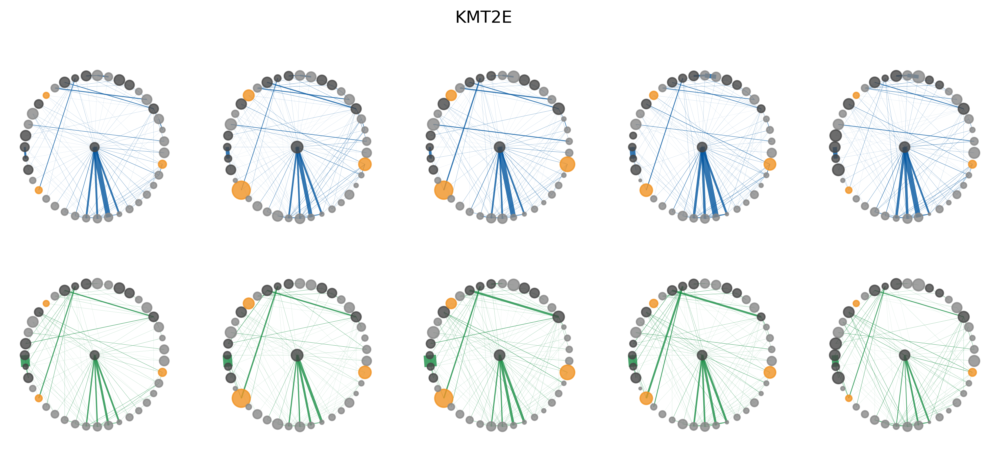

In [17]:

wills = ['KLF9', 'KLF15', 'SP2', 'SP3']

wills = ['KLF3','KLF11', 'KLF16', 'KLF1', 'KLF2',  'KLF4', 'KLF5', 'KLF6', 'KLF7', 'KLF8', 'KLF9', 'KLF10', 'KLF13', 'KLF14', 'KLF15','SP1', 'SP2','SP3','SP4','SP5', 'SP6', 'SP7','SP8','SP9','AR']

wills = ['KMT2A','KMT2B', 'KMT2C', 'KMT2D', 'KMT2E']

#[colorPalett[v] for k,v in g.nodes(data='nodeClass')]

for will_ in wills:
    will = GENES[will_]
    print(will_)


    l = list(nx.bfs_layers(H, will))
    g = H.subgraph(flatten(l[:2]))
    pos = nx.shell_layout(g,l[:2])


    fig = plt.figure(figsize=[12.5,5], dpi=400)
    gs = gridspec.GridSpec(nrows=2, ncols=5)
    for i, s in enumerate([ 'H3K27ac', 'H3K4me3']):
        for j, t in enumerate(['Vh', '30m', '4h', '16h', '72h']):
            fig.add_subplot(gs[i, j])

            MAPvl = dict(zip(N.index, N[f'AR_{t}']))
            w = {(a,b): w/10 for a,b,w in g.edges(data=f'{s}.{t}')}
            

            if s == 'H3K27ac':
                edge_color='#01559F'
            else:
                edge_color='#198E45'
            #w = dict(zip(w.keys(), minmax_scale(np.array(list(w.values())))*5))
            nx.draw(g, pos,edgelist=w.keys() , width=list(w.values()),
                node_color=[colorPalette[v] for k,v in g.nodes(data='nodeClass')],
                edge_color=edge_color,
                node_size = [
                    MAPvl[a] * 2.5
                    #if a != will else rna[t][will]
                    for a in g.nodes
                ],
                alpha=0.8, font_size=12,font_color='k',

            )

        fig.suptitle(will_)

    #fig.savefig(f'../plots/{will_}_GRAPH_MAIN.pdf', bbox_inches ="tight",  pad_inches = 1 )
#dict(zip([n for n in g.nodes if MAPcl[n] == 'ARcre'] + [will], ['ARBS1', 'ARBS2', 'ARBS3', 'ARBS5']+[will_]))

In [ ]:
STARR-seq - Chromatin looping: 

In [5]:
!awk '{print $1"\t"$2"\t"$3"\t"$4"\t"$5"\t"$6}' /groups/lackgrp/ll_members/berkay/1-notebook/col-matt-LNCaP/data/BEDPE/ALL_H3K27ac_16h.tmm.bedpe  > /groups/lackgrp/ll_members/berkay/1-notebook/col-matt-LNCaP/data/BEDPE/ALL_H3K27ac_16h.tmm.igv.bedpe

In [6]:
!head /groups/lackgrp/ll_members/berkay/1-notebook/col-matt-LNCaP/data/BEDPE/ALL_H3K27ac_16h.tmm.igv.bedpe

chr1	712000	713000	chr1	1167000	1168000
chr1	712000	713000	chr1	742000	743000
chr1	712000	713000	chr1	757000	758000
chr1	712000	713000	chr1	792000	793000
chr1	712000	713000	chr1	837000	838000
chr1	742000	743000	chr1	757000	758000
chr1	752000	753000	chr1	757000	758000
chr1	757000	758000	chr1	1167000	1168000
chr1	762000	763000	chr1	792000	793000
chr1	812000	813000	chr1	837000	838000


In [23]:

will = 'chr2:131954734-131959733'

l = list(nx.bfs_layers(H, will))
g = H.subgraph(flatten(l[:2]))
pos = nx.shell_layout(g,l[:2])


fig = plt.figure(figsize=[12.5,5], dpi=400)
gs = gridspec.GridSpec(nrows=2, ncols=5)
for i, s in enumerate([ 'H3K27ac', 'H3K4me3']):
	for j, t in enumerate(['Vh', '30m', '4h', '16h', '72h']):
		fig.add_subplot(gs[i, j])

		MAPvl = dict(zip(N.index, N[f'AR_{t}']))
		w = {(a,b): w/20 for a,b,w in g.edges(data=f'{s}.{t}')}
		

		if s == 'H3K27ac':
			edge_color='#01559F'
		else:
			edge_color='#198E45'
		#w = dict(zip(w.keys(), minmax_scale(np.array(list(w.values())))*5))
		nx.draw(g, pos,edgelist=w.keys() , width=list(w.values()),
			node_color=[colorPalette[v] for k,v in g.nodes(data='nodeClass')],
			edge_color=edge_color,
			node_size = [
				MAPvl[a] * 2.5
				#if a != will else rna[t][will]
				for a in g.nodes
			],
			alpha=0.8, font_size=12,font_color='k',

		)

NetworkXError: The node c is not in the graph.

In [25]:
'chr2:131986683-131991682' in 



'chr2:131986683-131991682'


False

In [31]:
bed = pd.DataFrame(H.nodes)
bed = bed[0].str.split(':|-', expand=True)
bed[(bed[0] == 'chr2') & (bed[1].astype(int)>131986683) & (bed[2].astype(int)<131991682)]

,0,1,2


In [18]:
len([n for n in g.nodes if MAPcl[n] == 'ARcre'])

8

In [ ]:


fig = plt.figure(figsize=[12.5,5], dpi=400)
gs = gridspec.GridSpec(nrows=2, ncols=5)
for i, s in enumerate([ 'H3K27ac', 'H3K4me3']):
	for j, t in enumerate(['Vh', '30m', '4h', '16h', '72h']):
		fig.add_subplot(gs[i, j])

		MAPvl = dict(zip(N.index, N[f'AR_{t}']))
		w = {(a,b): w/20 for a,b,w in g.edges(data=f'{s}.{t}')}
		

		if i == 0 and j == 0:
			label = {will:will_}
			label = dict(zip([n for n in g.nodes if MAPcl[n] == 'ARcre'] + [will], ['ARBS1', 'ARBS2', 'ARBS3', 'ARBS5']+[will_]))
		else:
			label = {}

		if s == 'H3K27ac':
			edge_color='#01559F'
		else:
			edge_color='#198E45'
		#w = dict(zip(w.keys(), minmax_scale(np.array(list(w.values())))*5))
		nx.draw(g, pos,edgelist=w.keys() , width=list(w.values()),
			node_color=[colorPalette[v] for k,v in g.nodes(data='nodeClass')],
			edge_color=edge_color,
			node_size = [
				MAPvl[a] * 2.5
				#if a != will else rna[t][will]
				for a in g.nodes
			],
			alpha=0.8,labels = label, font_size=12,font_color='k',

		)

In [9]:
'POTEE' in BEDPRO['Gene']

False

chr2	ENSEMBL	gene	131975882	132022965	.	+	.	gene_id "ENSG00000188219.10"; transcript_id "ENSG00000188219.10"; gene_type "protein_coding"; gene_status "KNOWN"; gene_name "POTEE"; transcript_type "protein_coding"; transcript_status "KNOWN"; transcript_name "POTEE"; level 3; tag "ncRNA_host";
chr2	ENSEMBL	transcript	131975882	132022965	.	+	.	gene_id "ENSG00000188219.10"; transcript_id "ENST00000356920.5"; gene_type "protein_coding"; gene_status "KNOWN"; gene_name "POTEE"; transcript_type "protein_coding"; transcript_status "KNOWN"; transcript_name "POTEE-201"; level 3; protein_id "ENSP00000439189.1"; tag "basic"; tag "appris_principal"; tag "CCDS"; ccdsid "CCDS46414.1";
chr2	ENSEMBL	exon	131975882	131976496	.	+	.	gene_id "ENSG00000188219.10"; transcript_id "ENST00000356920.5"; gene_type "protein_coding"; gene_status "KNOWN"; gene_name "POTEE"; transcript_type "protein_coding"; transcript_status "KNOWN"; transcript_name "POTEE-201"; exon_number 1; exon_id "ENSE00002507781.1"; level 3; prot

In [13]:



!grep 'ENSG00000188219' /groups/lackgrp/genomeAnnotations/hg19/gencode.v19.annotation.gtf | grep $'\ttranscript\t'

chr2	ENSEMBL	transcript	131975882	132022965	.	+	.	gene_id "ENSG00000188219.10"; transcript_id "ENST00000356920.5"; gene_type "protein_coding"; gene_status "KNOWN"; gene_name "POTEE"; transcript_type "protein_coding"; transcript_status "KNOWN"; transcript_name "POTEE-201"; level 3; protein_id "ENSP00000439189.1"; tag "basic"; tag "appris_principal"; tag "CCDS"; ccdsid "CCDS46414.1";
chr2	ENSEMBL	transcript	131975924	132022416	.	+	.	gene_id "ENSG00000188219.10"; transcript_id "ENST00000358087.5"; gene_type "protein_coding"; gene_status "KNOWN"; gene_name "POTEE"; transcript_type "protein_coding"; transcript_status "KNOWN"; transcript_name "POTEE-202"; level 3; protein_id "ENSP00000443049.1"; tag "basic";
